<a href="https://colab.research.google.com/github/UERJ-FISICA/Fisica-Moderna/blob/main/Movimento_Browniano.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation

### Parâmetros da simulação

In [2]:
# a.u.
width = 10
height = 10
radius = 0.05
mass = 0.1
v0 = 2.5
# s
step = 0.1
number_of_particles = 250
# color = 'blue'
colors = [ 'red', 'green', 'blue' ]
# Large particle
radius_large = 1.
mass_large = 10.0
v0_large = 0.
color_large = 'red'
hist_bins = 20
hist_range = (0.,10.)
random_seed = 12345
# random_seed = 100
borders_as_walls = True
debug = False

### Classe representando uma partícula e como ela colide com outras partículas

In [3]:
class Particle:
    def __init__( self, x, y, vx, vy, radius, mass, color ):
        self.x = x
        self.y = y
        self.vx = vx
        self.vy = vy
        self.radius = radius
        self.mass = mass
        self.color = color
    def collide( self, particle ):
        delta_x_ = ( particle.x - self.x )
        delta_y_ = ( particle.y - self.y )
        distance_ = np.sqrt( delta_x_ ** 2 + delta_y_ ** 2 )
        if distance_ < ( self.radius + particle.radius ):
            angle_ = np.arctan2( delta_y_, delta_x_ )
            x_self_newref_ = 0.
            y_self_newref_ = 0.
            part_x_newref_ = distance_
            part_y_newref_ = 0.
            vx_self_newref_ = self.vx * np.cos( angle_ ) + self.vy * np.sin( angle_ )
            vy_self_newref_ = self.vx * ( -np.sin( angle_ ) ) + self.vy * np.cos( angle_ )
            part_vx_newref_ = particle.vx * np.cos( angle_ ) + particle.vy * np.sin( angle_ )
            part_vy_newref_ = particle.vx * ( -np.sin( angle_ ) ) + particle.vy * np.cos( angle_ )

            # Collision
            # Assume approximately head-on, elastic collisions
            # vx_self_after_newref_ = ( 2. * particle.mass / ( self.mass + particle.mass ) ) * ( part_vx_newref_ - vx_self_newref_ ) + vx_self_newref_ 
            vx_self_after_newref_ = ( 2. * particle.mass * part_vx_newref_  + ( self.mass - particle.mass ) * vx_self_newref_ ) / ( self.mass + particle.mass )
            # part_vx_after_newref_ = ( ( particle.mass - self.mass ) / ( particle.mass + self.mass ) ) * ( part_vx_newref_ - vx_self_newref_ ) + vx_self_newref_ 
            part_vx_after_newref_ = ( vx_self_newref_ - part_vx_newref_) + vx_self_after_newref_

            x_self_newref_ -= ( self.radius + particle.radius - distance_ ) / 2.
            part_x_newref_ += ( self.radius + particle.radius - distance_ ) / 2.

            self.x = self.x + ( x_self_newref_ * np.cos( angle_ ) + y_self_newref_ * ( -np.sin( angle_ ) ) )
            self.y = self.y + ( x_self_newref_ * np.sin( angle_ ) + y_self_newref_ * np.cos( angle_ ) )

            particle.x = self.x + ( part_x_newref_ * np.cos( angle_ ) + part_y_newref_ * ( -np.sin( angle_ ) ) )
            particle.y = self.y + ( part_x_newref_ * np.sin( angle_ ) + part_y_newref_ * np.cos( angle_ ) )

            self.vx = vx_self_after_newref_ * np.cos( angle_ ) + vy_self_newref_ * ( -np.sin( angle_ ) )
            self.vy = vx_self_after_newref_ * np.sin( angle_ ) + vy_self_newref_ * np.cos( angle_ )

            particle.vx = part_vx_after_newref_ * np.cos( angle_ ) + part_vy_newref_ * ( -np.sin( angle_ ) )
            particle.vy = part_vx_after_newref_ * np.sin( angle_ ) + part_vy_newref_ * np.cos( angle_ )

### Inicialização das partículas

In [4]:
np.random.seed( random_seed )
particles = []
def init():
    # Large particle
    x_ = ( width / 2 )
    y_ = ( height / 2 )
    phi_ = -np.pi + 2 * np.pi * np.random.rand()
    vx_ = v0_large * np.cos( phi_ )
    vy_ = v0_large * np.sin( phi_ )
    radius_ = radius_large
    mass_ = mass_large
    color_ = color_large
    particles.append( Particle( x_, y_, vx_, vy_, radius_, mass_, color_ ) )
    n_tries_ = 0
    for ipart_ in range( number_of_particles ):
        while True:
            x_ = 0. + np.random.rand() * width
            y_ = 0. + np.random.rand() * height
            # vx_ = 0. + np.random.rand() * v0
            # vx_ = vx_ if np.random.rand() >= 0.5 else -vx_
            # vy_ = np.sqrt( v0 ** 2 - vx_ ** 2 )
            # vy_ = vy_ if np.random.rand() >= 0.5 else -vy_
            phi_ = -np.pi + 2 * np.pi * np.random.rand()
            vx_ = v0 * np.cos( phi_ )
            vy_ = v0 * np.sin( phi_ )
            radius_ = radius
            mass_ = mass
            color_ = colors[ ipart_ % len(colors) ]
            n_tries_ += 1
            # Check overlap with existing particle
            overlap_ = False
            for j in range( len(particles) ):
                delta_x_ = ( particles[ j ].x - x_ )
                delta_y_ = ( particles[ j ].y - y_ )
                if np.sqrt( delta_x_ ** 2 + delta_y_ ** 2 ) < ( radius_ + particles[ j ].radius ):
                    overlap_ = True
                    break
            if not overlap_:
                particles.append( Particle( x_, y_, vx_, vy_, radius_, mass_, color_ ) )
                break
    print ( "Initialized {} particles.".format( len(particles) ) )
    print ( "Number of tries: {}".format( n_tries_ ) )

init()

Initialized 251 particles.
Number of tries: 283


### Gráficos após inicialização: distribuição das partículas e trajetória da partícula maior

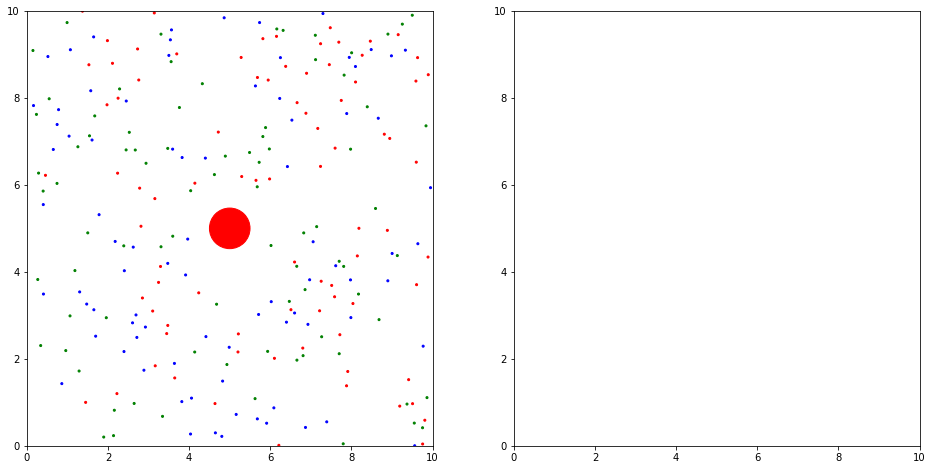

In [5]:
width_canvas = 8
height_canvas = ( height / width ) * width_canvas
fig, axes = plt.subplots( 1, 2, figsize=(2*width_canvas,height_canvas) )

array_x = np.zeros( len(particles) )
array_y = np.zeros( len(particles) )
array_colors = np.zeros( len(particles), dtype='U10' )
array_x[ 0 ] = particles[ 0 ].x
array_y[ 0 ] = particles[ 0 ].y
array_colors[ 0 ] = particles[ 0 ].color
for ipart_ in range( 1, len(particles) ):
    array_x[ ipart_ ] = particles[ ipart_ ].x
    array_y[ ipart_ ] = particles[ ipart_ ].y
    array_colors[ ipart_ ] = particles[ ipart_ ].color
if debug:
    print ( array_x )
    print ( array_y )
    print ( array_colors )

axes[ 0 ].set_xlim( 0., width )
axes[ 0 ].set_ylim( 0., height )
M_ = axes[ 0 ].transData.get_matrix()
xscale_ = M_[0,0]
# yscale_ = M_[1,1]
size_large_ = ( radius_large * xscale_ ) ** 2
size_ = ( radius * xscale_ ) ** 2
array_sizes = np.zeros( len(particles) )
array_sizes[ 0 ] = size_large_
array_sizes[ 1: ] = size_
if debug:
    print ( xscale_ )
    print ( size_large_ )
    print ( size_ )
    print ( array_sizes )

scatter_coll = axes[ 0 ].scatter( array_x, array_y, s=array_sizes, c=array_colors )

axes[ 1 ].set_xlim( 0., width )
axes[ 1 ].set_ylim( 0., height )
line_data_x = []
line_data_y = []
line, = axes[ 1 ].plot( line_data_x, line_data_y, '-', linewidth=2 )
# print ( line )

### Animação representando evolução temporal do sistema

In [6]:
def particle_collisions():
    for i in range( len(particles) ):
        for j in range( i+1, len(particles) ):
            partA_ = particles[ i ]
            partB_ = particles[ j ]
            delta_x_ = ( partB_.x - partA_.x )
            delta_y_ = ( partB_.y - partA_.y )
            if np.sqrt( delta_x_ ** 2  + delta_y_ ** 2 ) < ( partA_.radius + partB_.radius ):
                partA_.collide( partB_ )

def pass_borders():
    for ipart_ in range( len(particles) ):
        if particles[ ipart_ ].x < 0: particles[ ipart_ ].x += width
        if particles[ ipart_ ].x > width: particles[ ipart_ ].x -= width
        if particles[ ipart_ ].y < 0: particles[ ipart_ ].y += height
        if particles[ ipart_ ].y > height: particles[ ipart_ ].y -= height

def collide_on_walls():
    for ipart_ in range( len(particles) ):
        if ( particles[ ipart_ ].x - particles[ ipart_ ].radius ) < 0:
            particles[ ipart_ ].x = 0. + particles[ ipart_ ].radius
            particles[ ipart_ ].vx = -( particles[ ipart_ ].vx )
        if ( particles[ ipart_ ].x + particles[ ipart_ ].radius ) > width:
            particles[ ipart_ ].x = width - particles[ ipart_ ].radius
            particles[ ipart_ ].vx = -( particles[ ipart_ ].vx )
        if ( particles[ ipart_ ].y - particles[ ipart_ ].radius ) < 0:
            particles[ ipart_ ].y = 0. + particles[ ipart_ ].radius
            particles[ ipart_ ].vy = -( particles[ ipart_ ].vy )
        if ( particles[ ipart_ ].y + particles[ ipart_ ].radius ) > height:
            particles[ ipart_ ].y = height - particles[ ipart_ ].radius
            particles[ ipart_ ].vy = -( particles[ ipart_ ].vy )

def move_particles():
    for ipart_ in range( len(particles) ):
        particles[ ipart_ ].x += ( particles[ ipart_ ].vx * step )
        particles[ ipart_ ].y += ( particles[ ipart_ ].vy * step )

# def particle_speeds():
#     array_vx = np.zeros( len(particles) )
#     array_vy = np.zeros( len(particles) )
#     for ipart_ in range( len(particles) ):
#         array_vx[ ipart_ ] = particles[ ipart_ ].vx
#         array_vy[ ipart_ ] = particles[ ipart_ ].vy
#     array_v = np.sqrt( array_vx ** 2 + array_vy ** 2 )
#     return array_v

def update( frame_number ):
    
    if frame_number > 0:
        move_particles()

        particle_collisions()

        if borders_as_walls:
            collide_on_walls()
        else:
            pass_borders()

        for ipart_ in range( len(particles) ):
            array_x[ ipart_ ] = particles[ ipart_ ].x
            array_y[ ipart_ ] = particles[ ipart_ ].y

        array2D_ = np.c_[ array_x, array_y ]
        scatter_coll.set_offsets( array2D_ )

        line_data_x.append( array_x[ 0 ] )
        line_data_y.append( array_y[ 0 ] )
        # print ( line_data_x )
        # print ( line_data_y )
        line.set_data( line_data_x, line_data_y )

    return ( scatter_coll, line )

# Animation
animation = FuncAnimation( fig, update, frames=250, interval=( step * 1000 ) )
from IPython.display import HTML
HTML(animation.to_jshtml())